In [1]:
import requests
import json
import pandas as pd
import numpy as np
import regex as re
import nltk
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, RandomForestRegressor
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.pipeline import Pipeline, FeatureUnion

pd.set_option('display.max_columns', 999)  # This allows us to view all the columns
pd.set_option('display.max_rows', 999)
# pd.set_option('display.max_colwidth', -1)

%matplotlib inline

### 1. Import data

In [2]:
# Importing data and saving them as series
X_train = pd.read_csv('../dataset/X_train.csv',index_col=0,squeeze=True)
X_test = pd.read_csv('../dataset/X_test.csv', index_col=0,squeeze=True)
y_train = pd.read_csv('../dataset/y_train.csv', index_col=0,squeeze=True)
y_test = pd.read_csv('../dataset/y_test.csv', index_col=0,squeeze=True)

In [3]:
X_train.head()

422     ca az like tweet public inform illeg backgroun...
1128    gf clingi unreason gf year gener alway seen da...
1559    cheat onmi friend cheat girlfriend walk best t...
1608    get hope ex loneli feel afterward almost unbea...
1689    f super scare introduc black african boyfriend...
Name: text, dtype: object

In [4]:
X_train.shape

(1630,)

In [5]:
y_train.head()

422     0
1128    1
1559    1
1608    1
1689    1
Name: subreddit, dtype: int64

#### Baseline score

In [6]:
y = pd.concat([y_train, y_test], axis=0)
y.value_counts(normalize= True)

0    0.500981
1    0.499019
Name: subreddit, dtype: float64

### 2. Pipeline models

In [7]:
cv = CountVectorizer()
tvect = TfidfVectorizer()
lr = LogisticRegression()
mnb = MultinomialNB()
bnb = BernoulliNB()

In [8]:
# Creates 2 Logistic Regression pipelines using count and tfidf vectorizers
cv_lr_pipe = Pipeline([
    ('cv', cv),
    ('lr', lr)
])
tfidf_lr_pipe = Pipeline([
    ('tvect', tvect),
    ('lr', lr)
])

# Creates two Naive Bayes pipelines with Multinomial and binomial NB
m_nv_pipe = Pipeline([
    ('cv', cv),
    ('mnb', mnb)
])
b_nv_pipe = Pipeline([
    ('tvect', tvect),
    ('bnb', bnb)
])

In [9]:
# search params
params_cv = {
    'cv__max_features':[None,5000,10000],
    'cv__ngram_range':[(1,1),(1,2)]
}
params_tv = {
    'tvect__max_features':[None,4000,5000,10000],
    'tvect__ngram_range':[(1,1),(1,2)]
}

In [10]:
# This function creates a grid search given a pipeline, set of params to search over and data to train on,
# prints out best params found, and train w/test score
def gs(pipe,params,X_tr,y_tr,X,y):
    
    gs = GridSearchCV(pipe,param_grid=params)
    
    gs.fit(X_tr,y_tr);
    
    print('Best parameters:', gs.best_params_)
    print('Best Score:', gs.best_score_)
    print('Test Score:', gs.score(X,y))
    
    return gs

### 3. Logistic Regression models

In [11]:
# count vector
log_reg_cv = gs(cv_lr_pipe,params_cv,X_train,y_train,X_test,y_test)
log_reg_cv

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbf

Best parameters: {'cv__max_features': None, 'cv__ngram_range': (1, 2)}
Best Score: 0.9717791411042945
Test Score: 0.9803921568627451


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('cv',
                                        CountVectorizer(analyzer='word',
                                                        binary=False,
                                                        decode_error='strict',
                                                        dtype=<class 'numpy.int64'>,
                                                        encoding='utf-8',
                                                        input='content',
                                                        lowercase=True,
                                                        max_df=1.0,
                                                        max_features=None,
                                                        min_df=1,
                                                        ngram_range=(1, 1),
                                         

In [12]:
# tfidf vector
log_reg_tv = gs(tfidf_lr_pipe,params_tv,X_train,y_train,X_test,y_test)
log_reg_tv

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbf

Best parameters: {'tvect__max_features': 10000, 'tvect__ngram_range': (1, 2)}
Best Score: 0.9730061349693252
Test Score: 0.9705882352941176


C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('tvect',
                                        TfidfVectorizer(analyzer='word',
                                                        binary=False,
                                                        decode_error='strict',
                                                        dtype=<class 'numpy.float64'>,
                                                        encoding='utf-8',
                                                        input='content',
                                                        lowercase=True,
                                                        max_df=1.0,
                                                        max_features=None,
                                                        min_df=1,
                                                        ngram_range=(1, 1),
                                    

#### Evaluation

In [13]:
def pipeline_eval(pipeline):
    predictions = pipeline.predict(X_test)
    cm = confusion_matrix(y_test, predictions)
    cm_df = pd.DataFrame(cm,
                    columns = ['predicted neg', 'predicted pos'],
                    index = ['actual neg', 'actual pos'])
    
    TN = cm_df['predicted neg'][0]
    TP = cm_df['predicted pos'][1]
    FN = cm_df['predicted neg'][1]
    FP = cm_df['predicted pos'][0]
    accuracy = (TN + TP)/(TN + TP + FN + FP)
    
    print(f"Accuracy: {round(accuracy*100,1)}%")
    return cm_df

Evaluation for Logistic Regression with Count Vectorisation

In [14]:
pipeline_eval(log_reg_cv)

Accuracy: 98.0%


,predicted neg,predicted pos
actual neg,199,2
actual pos,6,201


Evaluation for Logistic Regression with TFIDF Vectorisation

In [15]:
pipeline_eval(log_reg_tv)

Accuracy: 97.1%


,predicted neg,predicted pos
actual neg,197,4
actual pos,8,199


### 4. Naive Bayes models

In [16]:
# Multinomial NB
multi_NB = gs(m_nv_pipe,params_cv,X_train,y_train,X_test,y_test)
multi_NB

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Best parameters: {'cv__max_features': 10000, 'cv__ngram_range': (1, 2)}
Best Score: 0.9748466257668712
Test Score: 0.9754901960784313


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('cv',
                                        CountVectorizer(analyzer='word',
                                                        binary=False,
                                                        decode_error='strict',
                                                        dtype=<class 'numpy.int64'>,
                                                        encoding='utf-8',
                                                        input='content',
                                                        lowercase=True,
                                                        max_df=1.0,
                                                        max_features=None,
                                                        min_df=1,
                                                        ngram_range=(1, 1),
                                         

In [17]:
# Binomial NB
binom_NB = gs(b_nv_pipe,params_tv,X_train,y_train,X_test,y_test)
binom_NB

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Best parameters: {'tvect__max_features': None, 'tvect__ngram_range': (1, 1)}
Best Score: 0.8889570552147239
Test Score: 0.875


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('tvect',
                                        TfidfVectorizer(analyzer='word',
                                                        binary=False,
                                                        decode_error='strict',
                                                        dtype=<class 'numpy.float64'>,
                                                        encoding='utf-8',
                                                        input='content',
                                                        lowercase=True,
                                                        max_df=1.0,
                                                        max_features=None,
                                                        min_df=1,
                                                        ngram_range=(1, 1),
                                    

#### Evaluation

Evaluation for multinominal Naive Bayes with Count Vectorisation

In [18]:
pipeline_eval(multi_NB)

Accuracy: 97.5%


,predicted neg,predicted pos
actual neg,196,5
actual pos,5,202


Evaluation for Binomial Naive Bayes with TFIDF Vectorisation

In [19]:
pipeline_eval(binom_NB)

Accuracy: 87.5%


,predicted neg,predicted pos
actual neg,195,6
actual pos,45,162


### 5. Random Forest vs Extra Trees model

In [20]:
rf = RandomForestClassifier()
et = ExtraTreesClassifier()

In [21]:
cvect= CountVectorizer(ngram_range=(1,2))
X_train_cv = cvect.fit_transform(X_train)
X_test_cv = cvect.transform(X_test)

In [22]:
cross_val_score(rf,X_train_cv,y_train).mean()

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.8717737785722024

In [23]:
cross_val_score(et,X_train_cv,y_train).mean()

C:\Users\User\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.8895569277434731

In [24]:
# Random forest scored better than extra trees model
rf = RandomForestClassifier()
rf_params = {
    'n_estimators': [100, 150, 200],
    'max_depth': [None, 1, 2, 3, 4, 5],
}
rf_gs = GridSearchCV(rf, param_grid=rf_params, cv=5)

In [25]:
rf_gs.fit(X_train_cv,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid

In [26]:
print(rf_gs.best_score_)
rf_gs.best_params_

0.9251533742331288


{'max_depth': None, 'n_estimators': 200}

In [27]:
print('train score:',rf_gs.score(X_train_cv, y_train))

print('test score:',rf_gs.score(X_test_cv, y_test))

train score: 1.0
test score: 0.9142156862745098


### 7. Best model selection and prediction

The best model is my Logistic Regression model with Count Vectorization

In [44]:
log_reg_cv.best_params_

{'cv__max_features': None, 'cv__ngram_range': (1, 2)}

In [45]:
lr = LogisticRegression()
cvec = CountVectorizer(log_reg_cv.best_params_)

In [46]:
cvec.fit(X_train)
print(len(cvec.get_feature_names()))

8550


In [47]:
X_train_cv = pd.DataFrame(cvec.transform(X_train).todense(),columns=cvec.get_feature_names())
X_test_cv = pd.DataFrame(cvec.transform(X_test).todense(),columns=cvec.get_feature_names())

In [61]:
X_test_cv

,aa,aaa,aaron,ab,aback,abamdon,abandon,abc,abcad,abdomen,abdomin,abid,abil,abilifi,abit,abl,abnorm,abonn,abort,aboutit,abras,abroad,abroadw,abrupt,abruptli,abscess,absenc,absent,absentmind,abslout,absolut,absurd,abt,abund,abus,abusehi,abusiveon,ac,acad,academ,academi,acceler,accent,accept,access,accid,accident,accidenthi,accidenti,accidentso,accommod,accomod,accompani,accomplish,accord,accordion,account,accountth,accru,accumul,accur,accus,accusatori,accustom,accutan,ace,ach,achiev,acknowledg,acquaint,acquaintancesi,acquir,acquitt,acronym,across,act,action,activ,activei,actor,actual,ad,ada,adam,adavan,add,addendum,addict,addictionmi,addit,address,addresstldr,adequ,adequaci,adhd,adher,adjac,adjoin,adjust,adjustor,admin,admincod,administ,administr,admir,admiss,admit,admittedli,adopt,adoptionmi,ador,adress,adt,adu,adult,adulthood,advanc,advantag,advent,adventur,advers,advertis,advic,advicea,advicehello,advicei,advicejust,advicemi,adviceso,adviceto,advicewif,advid,advis,advisor,advoc,aerospac,af,afar,affair,affect,affection,affectionhi,affectionwif,affidavit,affili,affirm,afford,afloat,aforement,afraid,afraif,african,aftermath,afternoon,afterschool,afterthought,afterward,ag,age,agea,agenc,agent,aggrav,aggreg,aggres,aggress,aggressor,agi,agit,ago,agoso,agre,agreeabl,agreement,agreementi,agress,ahaaa,ahaha,ahead,aheadfirst,ahold,aid,ailment,aim,aimlessli,aint,air,airbag,airbnb,airborn,airlin,airpod,airport,aita,aka,akin,al,alabama,alabamahi,alarm,alaska,albani,albeit,alberta,album,albuquerqu,alcohol,alert,alex,alf,alfi,alia,alibi,alien,aliexpress,align,alik,alimoni,aliv,aliveh,alivi,alleg,allerg,allergen,allergi,allergist,allevi,alley,allgemein,alli,alll,alloc,allot,allow,allud,allur,almond,almost,aload,alon,alonemi,along,aloof,alooot,alot,alotta,aloud,alreadi,alright,also,alt,alter,alterc,altern,although,altogeth,alwat,alway,amanda,amass,amaz,amazingli,amazon,amber,ambigu,ambit,ambiti,ambul,ambush,amd,amelia,amend,america,american,amex,ami,amiabl,amic,amidst,ammend,ammo,amnesia,among,amongst,amort,amount,amp,anal,analysi,analyst,analyz,android,anecdot,angel,angelesi,anger,angl,angri,angrier,angrili,angst,anim,ann,anna,anniversari,annnnd,announc,annoy,annoyedso,annoyingi,annual,annul,annum,annyo,anonym,anorex,anorexia,anoth,answer,anti,antibiot,antic,anticip,antidepress,antisoci,antivax,antonio,anu,anw,anxieti,anxietyaround,anxietyim,anxietythrowaway,anxiou,anxioushi,anybodi,anycas,anyhow,anymor,anymorealt,anymorei,anymoremi,anymoreso,anyon,anyth,anytim,anyway,anywaycan,anywaysi,anywher,anywho,ap,apart,apartmenti,apartmentsso,apathet,apay,apolog,apologet,apologis,apostil,app,appal,appar,appart,appeal,appear,appeas,appetit,appl,appli,applianc,applic,appoint,appos,apprais,appreci,appreciatedokay,apprehens,appreic,apprentic,apprenticeship,approach,appropri,approv,approvedloc,approx,approxim,appt,apreci,april,aproach,aproch,apt,ar,arbitr,arbitrari,arbitrarili,arcadia,arch,architect,area,arent,areth,argu,argument,aris,arizona,arkansa,arm,armchair,armi,arney,around,arous,arraign,arrang,arrest,arriv,arrog,arrogantli,arround,art,articl,artist,artwork,aruba,arundel,as,asap,ascertain,asexu,asf,ash,asham,ashtray,asian,asid,ask,askreddit,asleep,asleepappar,asp,aspect,asper,asperg,ass,assault,assaultchico,assert,asset,assetshello,assgirlfriend,asshol,assign,assing,assist,associ,assum,assumedli,assumpt,assur,asthma,astonish,astound,asum,aswel,ate,atf,atheist,athlet,atlanta,atlantiqu,atleast,atm,atmospher,attach,attack,attain,attempt,attend,attent,atti,attir,attitud,attorney,attorneymeet,attract,attribut,au,auction,audac,audio,audiobook,audit,auditor,aug,august,aunt,...,urg,urgenc,urgent,url,usa,usag,usaher,usahi,usc,usci,usd,use,useless,user,usernam,usi,usnot,usp,usual,usw,utah,uterin,uteru,uti,util,utm,utma,utsa,utter,utterli,va,vacant,vacat,vacationher,vacay,vaccin,vacuum,vagin,vagina,vagu,valentin,valid,valu,valuabl,valv,van,vancouv,vandal,vanilla,vanish,vape,vapid,vapoinhal,vapor,vari,variabl,variat,varieti,variou,vasectomi,vastli,vcing,vega,v

In [48]:
columns = cvec.get_feature_names()

In [49]:
lr.fit(X_train_cv, y_train)
y_pred = lr.predict(X_test_cv)

C:\Users\User\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [50]:
y_pred

array([1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1,

In [51]:
# score Logistic Regression model

train_score = lr.score(X_train_cv,y_train)
print('train_score:',train_score)

test_score = lr.score(X_test_cv,y_test)
print('test_score:',test_score)
print('')

# create confusion matrix

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

print("True Positives: %s" % tp)
print("False Positives: %s" % fp)
print("False Negatives: %s" % fn)
print("True Negatives: %s" % tn)
print('')

# confusion matrix metrics

accuracy = ((tp+tn)/(tp+fp+fn+tn))*100
sensitivity = (tp/(tp+fn))*100
specificity = (tn/(tn+fp))*100
precision = (tp/(tp+fp))*100

print(f'Accuracy: {round(accuracy,1)}%')
print(f'Sensitivity: {round(sensitivity,1)}%')
print(f'Specificity: {round(specificity,1)}%')
print(f'Precision: {round(precision,1)}%')

train_score: 1.0
test_score: 0.9779411764705882

True Positives: 201
False Positives: 3
False Negatives: 6
True Negatives: 198

Accuracy: 97.8%
Sensitivity: 97.1%
Specificity: 98.5%
Precision: 98.5%


In [60]:
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(data=cm, columns=['predicted relationship', 'predicted legal'], index=['actual relationship', 'actual legal'])
cm_df

,predicted relationship,predicted legal
actual relationship,198,3
actual legal,6,201


In [53]:
pred_proba = [i[1] for i in lr.predict_proba(X_test_cv)]
pred_df = pd.DataFrame({'true_values': y_test,'pred_probs':pred_proba})

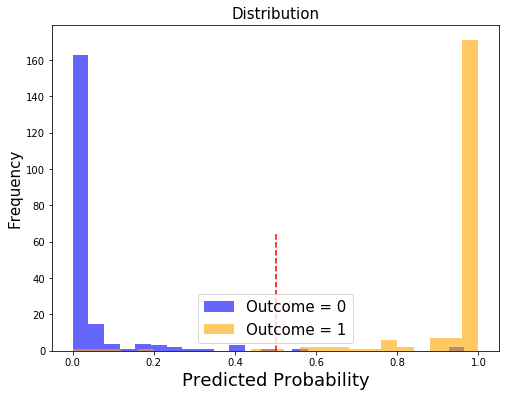

In [54]:
plt.figure(figsize = (8,6))

plt.hist(pred_df[pred_df['true_values'] == 0]['pred_probs'],
         bins=25,
         color='b',
         alpha = 0.6,
         label='Outcome = 0')
plt.hist(pred_df[pred_df['true_values'] == 1]['pred_probs'],
         bins=25,
         color='orange',
         alpha = 0.6,
         label='Outcome = 1')

plt.vlines(x=0.5,
           ymin = 0,
           ymax = 65,
           color='r',
           linestyle = '--')

plt.title('Distribution', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xlabel('Predicted Probability', fontsize=18)

plt.legend(fontsize=15);

This figure illustrates the confusion matrix above. As majority of observations fall on either true positives or true negatives, the bar at 0 and 1 is significantly higher than the rest. Furthermore, there is a very small overlap between the two outcomes which goes to show that the model chosen is able to clasify very accurately.

In [55]:
lr_coef = pd.DataFrame(lr.coef_, columns=columns)
lr_coef

,aa,aaa,aaron,ab,aback,abamdon,abandon,abc,abcad,abdomen,abdomin,abid,abil,abilifi,abit,abl,abnorm,abonn,abort,aboutit,abras,abroad,abroadw,abrupt,abruptli,abscess,absenc,absent,absentmind,abslout,absolut,absurd,abt,abund,abus,abusehi,abusiveon,ac,acad,academ,academi,acceler,accent,accept,access,accid,accident,accidenthi,accidenti,accidentso,accommod,accomod,accompani,accomplish,accord,accordion,account,accountth,accru,accumul,accur,accus,accusatori,accustom,accutan,ace,ach,achiev,acknowledg,acquaint,acquaintancesi,acquir,acquitt,acronym,across,act,action,activ,activei,actor,actual,ad,ada,adam,adavan,add,addendum,addict,addictionmi,addit,address,addresstldr,adequ,adequaci,adhd,adher,adjac,adjoin,adjust,adjustor,admin,admincod,administ,administr,admir,admiss,admit,admittedli,adopt,adoptionmi,ador,adress,adt,adu,adult,adulthood,advanc,advantag,advent,adventur,advers,advertis,advic,advicea,advicehello,advicei,advicejust,advicemi,adviceso,adviceto,advicewif,advid,advis,advisor,advoc,aerospac,af,afar,affair,affect,affection,affectionhi,affectionwif,affidavit,affili,affirm,afford,afloat,aforement,afraid,afraif,african,aftermath,afternoon,afterschool,afterthought,afterward,ag,age,agea,agenc,agent,aggrav,aggreg,aggres,aggress,aggressor,agi,agit,ago,agoso,agre,agreeabl,agreement,agreementi,agress,ahaaa,ahaha,ahead,aheadfirst,ahold,aid,ailment,aim,aimlessli,aint,air,airbag,airbnb,airborn,airlin,airpod,airport,aita,aka,akin,al,alabama,alabamahi,alarm,alaska,albani,albeit,alberta,album,albuquerqu,alcohol,alert,alex,alf,alfi,alia,alibi,alien,aliexpress,align,alik,alimoni,aliv,aliveh,alivi,alleg,allerg,allergen,allergi,allergist,allevi,alley,allgemein,alli,alll,alloc,allot,allow,allud,allur,almond,almost,aload,alon,alonemi,along,aloof,alooot,alot,alotta,aloud,alreadi,alright,also,alt,alter,alterc,altern,although,altogeth,alwat,alway,amanda,amass,amaz,amazingli,amazon,amber,ambigu,ambit,ambiti,ambul,ambush,amd,amelia,amend,america,american,amex,ami,amiabl,amic,amidst,ammend,ammo,amnesia,among,amongst,amort,amount,amp,anal,analysi,analyst,analyz,android,anecdot,angel,angelesi,anger,angl,angri,angrier,angrili,angst,anim,ann,anna,anniversari,annnnd,announc,annoy,annoyedso,annoyingi,annual,annul,annum,annyo,anonym,anorex,anorexia,anoth,answer,anti,antibiot,antic,anticip,antidepress,antisoci,antivax,antonio,anu,anw,anxieti,anxietyaround,anxietyim,anxietythrowaway,anxiou,anxioushi,anybodi,anycas,anyhow,anymor,anymorealt,anymorei,anymoremi,anymoreso,anyon,anyth,anytim,anyway,anywaycan,anywaysi,anywher,anywho,ap,apart,apartmenti,apartmentsso,apathet,apay,apolog,apologet,apologis,apostil,app,appal,appar,appart,appeal,appear,appeas,appetit,appl,appli,applianc,applic,appoint,appos,apprais,appreci,appreciatedokay,apprehens,appreic,apprentic,apprenticeship,approach,appropri,approv,approvedloc,approx,approxim,appt,apreci,april,aproach,aproch,apt,ar,arbitr,arbitrari,arbitrarili,arcadia,arch,architect,area,arent,areth,argu,argument,aris,arizona,arkansa,arm,armchair,armi,arney,around,arous,arraign,arrang,arrest,arriv,arrog,arrogantli,arround,art,articl,artist,artwork,aruba,arundel,as,asap,ascertain,asexu,asf,ash,asham,ashtray,asian,asid,ask,askreddit,asleep,asleepappar,asp,aspect,asper,asperg,ass,assault,assaultchico,assert,asset,assetshello,assgirlfriend,asshol,assign,assing,assist,associ,assum,assumedli,assumpt,assur,asthma,astonish,astound,asum,aswel,ate,atf,atheist,athlet,atlanta,atlantiqu,atleast,atm,atmospher,attach,attack,attain,attempt,attend,attent,atti,attir,attitud,attorney,attorneymeet,attract,attribut,au,auction,audac,audio,audiobook,audit,auditor,aug,august,aunt,...,urg,urgenc,urgent,url,usa,usag,usaher,usahi,usc,usci,usd,use,useless,user,usernam,usi,usnot,usp,usual,usw,utah,uterin,uteru,uti,util,utm,utma,utsa,utter,utterli,va,vacant,vacat,vacationher,vacay,vaccin,vacuum,vagin,vagina,vagu,valentin,valid,valu,valuabl,valv,van,vancouv,vandal,vanilla,vanish,vape,vapid,vapoinhal,vapor,vari,variabl,variat,varieti,variou,vasectomi,vastli,vcing,vega,v

In [56]:
df_coef = lr_coef.T.sort_values(by = 0, ascending=False)
df_coef

,0
relationship,1.117628
boyfriend,1.008154
love,0.872638
feel,0.815687
girl,0.786338
...,...
lea,-0.643930
court,-0.743888
anyth,-0.754199
state,-0.779653


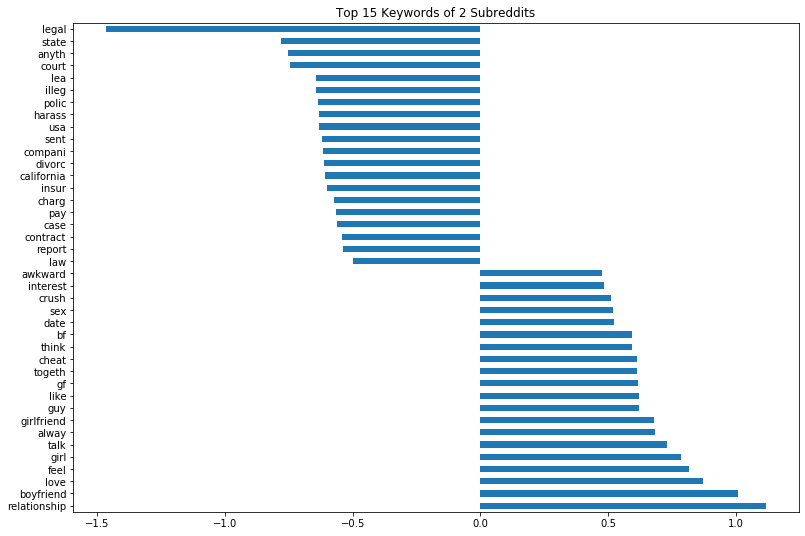

In [59]:
key_words = pd.concat([df_coef.head(20),df_coef.tail(20)],axis=0)
key_words.plot(kind='barh', figsize=(13,9), legend=False, title='Top 15 Keywords of 2 Subreddits');

This figure shows the top 15 keywords of each subreddits used to classify the texts to the specific subreddits 